<table align="center" width=100%>
    <tr>
        <td width="15%">
            <img src="Great_Learning_Logo.jpg">
        </td>
        <td>
            <div align="center">
                <font color="#21618C" size=6px>
                    <b> Cycle test 3 - PDS <br>
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

**NAME : Vinod** <br>
**DEPT : Data Science**

### I. Read the Dataset ‘modifiedfifa.csv' and answer the following questions. (15 marks)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', None)

In [2]:
df = pd.read_csv('modifiedfifa.csv')
df.shape

(15114, 24)

In [3]:
df.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Nationality', 'Overall',
       'Potential', 'Club', 'Value', 'Wage', 'Special', 'Preferred Foot',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate',
       'Body Type', 'Real Face', 'Position', 'Jersey Number', 'Joined',
       'Contract Valid Until', 'Height', 'Weight'],
      dtype='object')

In [4]:
# Null check
df.isnull().sum().sum()

0

#### 1.	Find how many different countries players data is included in the dataset (1 Mark)

In [5]:
print("The dataset contains players from", len(df['Nationality'].unique()),"different countries")

The dataset contains players from 159 different countries


#### 2.	Find out highest Valued player from the dataset (1 Mark)

In [6]:
print(df[df['Value'] == max(df['Value'])]['Name'].values[0],"was the Highest Valued player from the dataset")

Neymar Jr was the Highest Valued player from the dataset


#### 3.	Find which country's players data is maximum in the dataset and what’s is the count of it (2 Marks)

In [7]:
data = df['Nationality'].value_counts().sort_values(ascending=False)
print(data.index[0], "country's players data is maximum in the dataset and counts",data.values[0], 'players')

England country's players data is maximum in the dataset and counts 1269 players


#### 4.	Display top 10 clubs ordered by sum of all player’s current market value of that club (3 Marks)

In [8]:
data = df.groupby(by='Club')['Value'].sum().sort_values(ascending=False).head(10)
pd.DataFrame(data)

,Value
Club,
Real Madrid,810600.0
FC Barcelona,807800.0
Juventus,674975.0
Manchester City,668655.0
Paris Saint-Germain,625325.0
Liverpool,569055.0
FC Bayern Mnchen,560225.0
Chelsea,533815.0
Manchester United,529475.0


#### 5.	Count the number of players having International Reputation ratings = 4 from the clubs 'Real Madrid’ and ‘FC Barcelona’ (3 Marks)

In [9]:
count = df[(df["International Reputation"] == 4) & ((df['Club'] == "Real Madrid") | (df['Club'] == "FC Barcelona"))]['ID'].count()
print(count,"players having International Reputation ratings with '4' from the clubs 'Real Madrid' and 'FC Barcelona'")

10 players having International Reputation ratings with '4' from the clubs 'Real Madrid' and 'FC Barcelona'


#### 6.	Find out the names of the youngest and oldest players from the dataset (5 Marks)


In [10]:
df['Age'].describe()

count    15114.000000
mean        25.216753
std          4.722932
min         16.000000
25%         21.000000
50%         25.000000
75%         29.000000
max         44.000000
Name: Age, dtype: float64

In [11]:
# as per descriptive analysis of age we are categorizing 
# youngest players from min_age 
# oldest players from max_age

minimum_age = min(df['Age'])
maximum_age = max(df['Age'])

print("The names of the youngest and oldest players from the dataset")
pd.DataFrame(df[(df['Age'] == minimum_age) | (df['Age'] == maximum_age) ][['Name','Age']].values, 
             columns=['Name', 'Age']).sort_values(by='Age', ascending=True, ignore_index=True)

The names of the youngest and oldest players from the dataset


,Name,Age
0,M. Larsen,16
1,M. Kstenbauer,16
2,J. Olstad,16
3,F. Tauchhammer,16
4,Y. Roemer,16
5,A. Mahlonoko,16
6,C. Bassett,16
7,K. Broda,16
8,A. Taoui,16
9,P. Samiec-Talar,16


<br>
<br>
<br>
<br>
<br>


### II. Read the dataset atheletes.csv and regions.csv and answer the following questions.


In [12]:
df_althelets = pd.read_csv('athlete_events.csv')
df_althelets.shape

(271116, 15)

In [13]:
df_althelets.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object')

In [14]:
# Null check
df_althelets.isnull().sum()

ID             0
Name           0
Sex            0
Age         9474
Height     60171
Weight     62875
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     231333
dtype: int64

In [15]:
df_regions = pd.read_csv('datasets_31029_40943_noc_regions.csv')
df_regions.shape

(230, 3)

In [16]:
df_regions.columns

Index(['NOC', 'region', 'notes'], dtype='object')

In [17]:
# Null check
df_regions.isnull().sum()

NOC         0
region      3
notes     209
dtype: int64

#### 1.	Merge the dataset athletes and regions. (2 Marks)

In [18]:
df_merged = df_althelets.merge(df_regions, on='NOC', how='left')

In [19]:
df_merged.shape

(271116, 17)

In [20]:
df_merged.head(10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
7,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN
8,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
9,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN


#### 2.	Show the distribution of the age of gold medallists (4 Marks)


In [21]:
df_goldMedalist = df_merged[df_merged['Medal'] == 'Gold']
df_goldMedalist['Age'].isnull().sum()
df_goldMedalist_WN = df_goldMedalist.dropna(subset=['Age'])

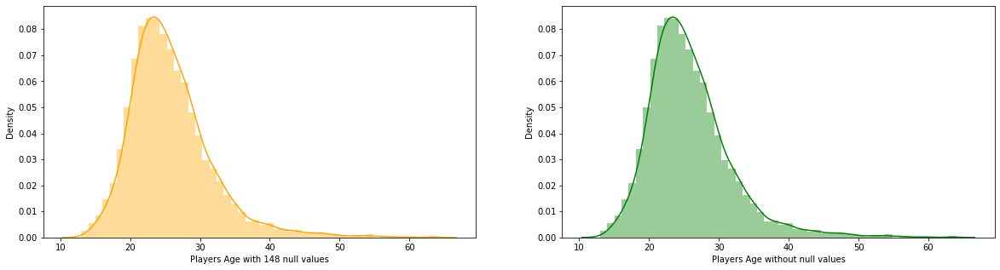

In [22]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

sns.distplot(df_goldMedalist['Age'], ax=axes[0], axlabel="Players Age with 148 null values", color='orange')
sns.distplot(df_goldMedalist_WN['Age'], ax=axes[1], axlabel="Players Age without null values", color='green')

plt.show()

#### 3.	Display the number of athletes who are gold medallists and whose age is greater than 50 with their info. (4 Marks)


In [23]:
df_gm_abv_50 = pd.DataFrame(df_goldMedalist_WN[df_goldMedalist_WN["Age"] > 50]).sort_values(by='Age', ignore_index=True)
df_gm_abv_50

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,84709,Harald Natvig,M,51.0,NaN,NaN,Norway,NOR,1924 Summer,1924,Summer,Paris,Shooting,"Shooting Men's Running Target, Single Shot, Team",Gold,Norway,NaN
1,119985,Peter Thomsen,M,51.0,183.0,72.0,Germany,GER,2012 Summer,2012,Summer,London,Equestrianism,"Equestrianism Mixed Three-Day Event, Team",Gold,Germany,NaN
2,54161,Harry Wyndham Jefferson,M,51.0,NaN,NaN,Bona Fide,GBR,1900 Summer,1900,Summer,Paris,Sailing,Sailing Mixed 3-10 Ton,Gold,UK,NaN
3,124220,"Hendrikus ""Driekske"" van Bussel",M,51.0,NaN,NaN,Netherlands,NED,1920 Summer,1920,Summer,Antwerpen,Archery,"Archery Men's Target Archery, 28 metres, Team",Gold,Netherlands,NaN
4,85949,Anders Peter Nielsen,M,52.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Shooting,"Shooting Men's Military Rifle, Standing, 300 m...",Gold,Denmark,NaN
5,67726,Maurice Marie Lecoq,M,52.0,NaN,NaN,France,FRA,1906 Summer,1906,Summer,Athina,Shooting,"Shooting Men's Free Pistol, 25 metres",Gold,France,NaN
6,66323,Paul Maximilien Landowski,M,52.0,NaN,NaN,France,FRA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Sculpturing, Statues",Gold,France,NaN
7,61257,Reiner Klimke,M,52.0,184.0,66.0,West Germany,FRG,1988 Summer,1988,Summer,Seoul,Equestrianism,"Equestrianism Mixed Dressage, Team",Gold,Germany,NaN
8,120060,Lars Einar Vilhelm Thrn,M,52.0,175.0,70.0,Rush V,SWE,1956 Summer,1956,Summer,Melbourne,Sailing,Sailing Mixed 5.5 metres,Gold,Sweden,NaN
9,84997,Josef Carl Peter Neckermann,M,52.0,183.0,65.0,Germany,GER,1964 Summer,1964,Summer,Tokyo,Equestrianism,"Equestrianism Mixed Dressage, Team",Gold,Germany,NaN


In [24]:
# info of 65 gold mendalist in age above 50
df_gm_abv_50.describe()

,ID,Age,Height,Weight,Year
count,65.000000,65.000000,15.000000,14.00000,65.000000
mean,84313.984615,55.338462,178.266667,73.00000,1935.846154
std,40418.385382,3.532337,5.378086,6.78233,34.433464
min,2894.000000,51.000000,165.000000,63.00000,1900.000000
25%,54161.000000,53.000000,175.000000,67.00000,1908.000000
50%,85949.000000,54.000000,178.000000,72.50000,1924.000000
75%,119985.000000,57.000000,183.000000,77.50000,1956.000000
max,133226.000000,64.000000,184.000000,83.00000,2016.000000


#### 4.	Women who can play in summer (2 Marks) 

In [25]:
womens_with_dup = df_merged[(df_merged['Sex'] == 'F') & (df_merged['Season'] == 'Summer')][['Name', 'ID']]
womens_with_dup

,Name,ID
26,"Cornelia ""Cor"" Aalten (-Strannood)",8
27,"Cornelia ""Cor"" Aalten (-Strannood)",8
32,Minna Maarit Aalto,13
33,Minna Maarit Aalto,13
79,Ragnhild Margrethe Aamodt,21
80,Andreea Aanei,22
91,Willemien Aardenburg,29
105,Ann Kristin Aarnes,37
135,Moonika Aava,49
136,Moonika Aava,49


In [26]:
womens_without_dup = womens_with_dup.groupby(by='ID').describe()

In [27]:
print("In total", len(womens_without_dup), "womens plays in summer")

In total 28851 womens plays in summer


In [28]:
pd.DataFrame(womens_without_dup['Name']['top'].values, columns=['Name'])

,Name
0,"Cornelia ""Cor"" Aalten (-Strannood)"
1,Minna Maarit Aalto
2,Ragnhild Margrethe Aamodt
3,Andreea Aanei
4,Willemien Aardenburg
5,Ann Kristin Aarnes
6,Moonika Aava
7,Patimat Abakarova
8,Mariya Vasilyevna Abakumova (-Tarabina)
9,Tamara Abalde Daz


#### 5.	Display the top 5 countries who won the most medals. Support your answer with suitable plot. (3 Marks)

In [29]:
df_temp = pd.DataFrame(df_merged.groupby(by=['region'])['Medal'].count())
df_temp

,Medal
region,
Afghanistan,2
Albania,0
Algeria,17
American Samoa,0
Andorra,0
Angola,0
Antigua,0
Argentina,274
Armenia,16


In [30]:
df_top5_region = df_temp.sort_values( by= 'Medal',ascending=False).head()
df_top5_region

,Medal
region,
USA,5637
Russia,3947
Germany,3756
UK,2068
France,1777


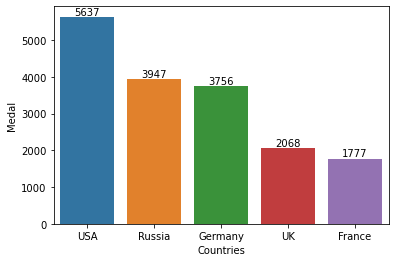

In [31]:
ax = sns.barplot(x=df_top5_region.index, y=df_top5_region['Medal'])
plt.xlabel('Countries')
plt.bar_label(ax.containers[0])
plt.show()